This is a working notebook explores using k-means and GMM to identify areas of flood and shadow within an urban flood image.

Kmeans and GMM maps are developed with 6 and 8 clusters. 
Outputs are written out as tif files. 

The Kmeans results are sampled with a set of reference data points and a final Kmeans is chosen based on minimizing the in-class variation. 

The goal is that the final Kmeans is then labeled using skimage measure.label so that regionprops can be used to identify characteristics of clusters/classes of interest(shadow, water).

# Import packages and set working directories

In [1]:
# Import packages
import os, sys
import numpy as np
import geopandas as gpd
from matplotlib import pyplot as plt
import pandas as pd
from glob import glob
import rasterio as rio
import earthpy.spatial as es
import earthpy.plot as ep
import earthpy as et

%matplotlib inline

In [2]:
# Set working directory
os.chdir(os.path.join(et.io.HOME, 'earth-analytics','spring-2019', 'flood-detection'))
os.environ["PROJ_LIB"] = r"C:\Users\katy\Anaconda3\envs\earth-analytics-python\Library\share"

In [3]:
# Set directory to area of interest containing raster stack
aoi = "koumassi_focus_ps"

# Open existing raster stack
band_path = os.path.join("dg-data", aoi +"\\")
band_stack_path = os.path.join(band_path, "outputs\\indices_and_mask_files\\")
all_bands_path = os.path.join(band_stack_path, aoi + "_all_bands.tif")

# # If all_bands raster stack has not been created, un-comment and run this code
# all_dg_bands = glob(band_path+"*band_*")
# all_dg_bands.sort()
# all_bands_path = os.path.join(band_stack_path, aoi + "_all_bands.tif")
# all_bands, all_bands_meta = es.stack(all_dg_bands,
#                                              all_bands_path)

In [4]:
outputs_path = os.path.join(band_path, "outputs\\clustering\\")
try:
    os.makedirs(outputs_path)
except FileExistsError:
    print("Directory already exists!")
# outputs_path = os.path.join(band_path, "outputs\\")
# all_bands_path = os.path.join(outputs_path, aoi + "_all_bands.tif")
# index_stack_path = os.path.join(outputs_path, aoi + "_index_stack.tif")

Directory already exists!


In [5]:
# Create raster stack of indices (msi, ndvi, ndwi1)
index_path = os.path.join("dg-data",aoi,"outputs\\indices_and_mask_files\\")
index_rasters = glob(index_path+"*_raw_test*")
index_rasters.sort()

index_stack_path = os.path.join(outputs_path, aoi + "_index_stack.tif")
index_stack, index_stack_meta = es.stack(index_rasters,
                                             index_stack_path)

# Open raster stack of interest - make 8 band and RGB-NIR stack

In [6]:
# Open 8-band WV-2 raster stack
with rio.open(all_bands_path) as src:
    all_bands_stack = src.read()
    stack_meta = src.meta
    files_out_meta = src.meta.copy()
    
# Update files out meta for writing out single files
files_out_meta['count']=1

In [7]:
# Open index stack (MSI, NDVI, NDWI1)
with rio.open(index_stack_path) as src:
    index_stack = src.read()
    index_stack_meta = src.meta
    index_stack_files_out_meta = src.meta.copy()
    
# Update files out meta for writing out single files
index_stack_files_out_meta['count']=1

(<Figure size 720x720 with 1 Axes>,
 <matplotlib.axes._subplots.AxesSubplot at 0x1cac303d898>)

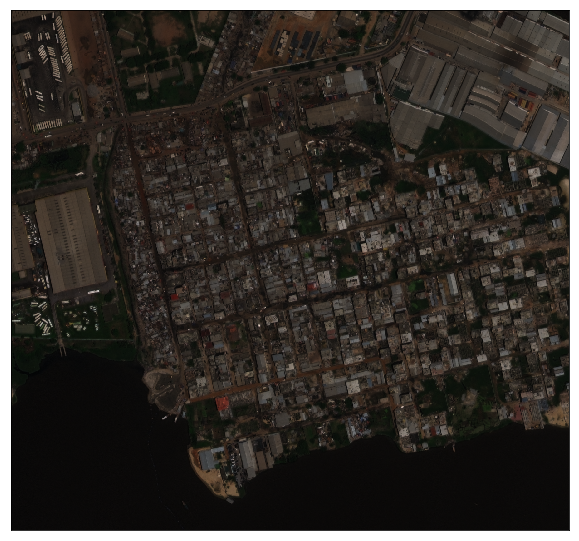

In [8]:
# Make RGB-NIR stack for segmentation
rgb_bands = glob(band_path+"*band_[1,2,4,6]*")
rgb_bands.sort()
rgb_bands_path = os.path.join(outputs_path, aoi + "_rgb_bands.tif")
rgb_bands, rgb_bands_meta = es.stack(rgb_bands,
                                             rgb_bands_path)

ep.plot_rgb(rgb_bands,rgb=(2, 1, 0))

# Define K-means clustering model and run on all_band and RGB-NIR stacks

In [16]:
from sklearn.cluster import KMeans
from scipy.ndimage import generic_filter

# Define classifier
nclass = 8
clf_kmeans = KMeans(n_clusters=nclass, random_state=10)
clf_kmeans_6_clusters = KMeans(n_clusters=6, random_state=10)

In [10]:
# Reshape array 
all_bands_im = np.rollaxis(all_bands_stack, 0, 3)
X = all_bands_im.reshape(-1,8)
                                      
# ndvi = np.expand_dims(((TestData[:,3] - TestData[:,2]) / (TestData[:,3] + TestData[:,2])), axis=1)
# ndvi[np.isnan(ndvi)] = -9999
#TestData = np.hstack((TestData, ndvi))

In [11]:
# Fit the KMeans classifier to the 8-band raster stack
predictedClass = clf_kmeans.fit_predict(X, y=None)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass += 1

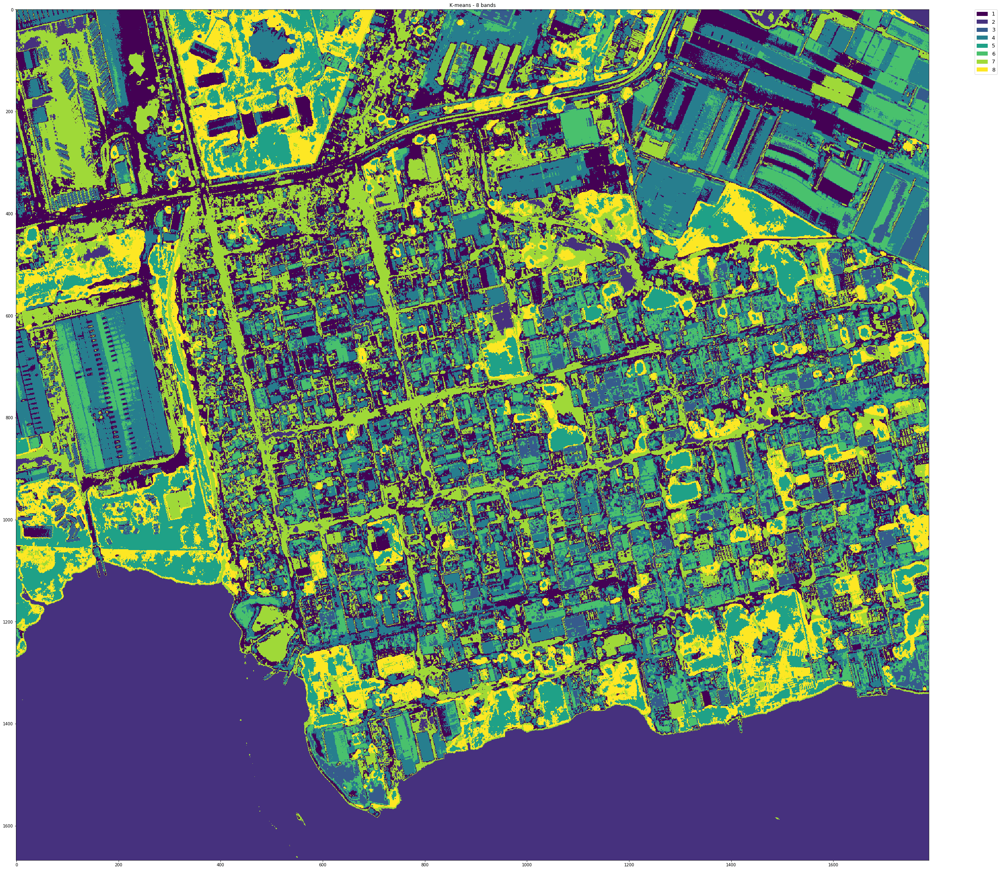

In [12]:
## Plot the result
fig, ax = plt.subplots(figsize = (40,40))
pred_data = predictedClass.reshape(all_bands_im.shape[:2])
im = ax.imshow(pred_data)
values = np.unique(pred_data)
cat_names = ["1","2","3","4","5","6","7","8"]
ep.draw_legend(im,titles=cat_names)
plt.title("K-means - 8 clusters - 8 bands")
# ax[1].imshow(all_bands_stack)
plt.show()

In [17]:
# Fit the KMeans classifier to the 8-band raster stack
predictedClass_6_clusters = clf_kmeans_6_clusters.fit_predict(X, y=None)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass_6_clusters += 1

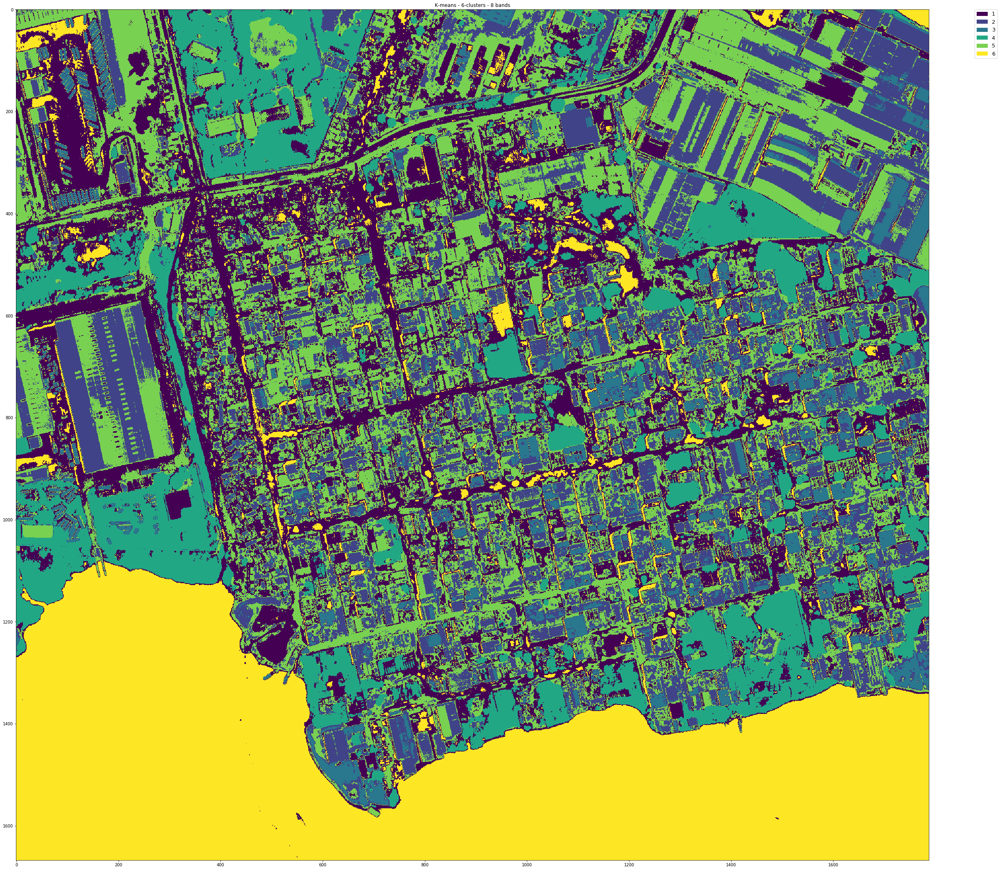

In [18]:
## Plot the result
fig, ax = plt.subplots(figsize = (40,40))
pred_data_6_clusters = predictedClass_6_clusters.reshape(all_bands_im.shape[:2])
im = ax.imshow(pred_data_6_clusters)
values = np.unique(pred_data_6_clusters)
cat_names = ["1","2","3","4","5","6"]
ep.draw_legend(im,titles=cat_names)
plt.title("K-means - 6-clusters - 8 bands")
# ax[1].imshow(all_bands_stack)
plt.show()

In [19]:
# Calculate and add texture to all_bands_stack, creating 9-dim array

# Add in a sliding window calculation for texture
radius = 5
texture = generic_filter(all_bands_im[:,:,1], np.std, size=2*radius)
texture_newaxis = texture[np.newaxis,:]
bands_and_texture = np.vstack((all_bands_stack, texture_newaxis))
all_bands_text_im = np.rollaxis(bands_and_texture,0,3)
X_text = all_bands_text_im.reshape(-1,9)

In [20]:
# fit the KMeans classifier to stack with texture 
predictedClass_text = clf_kmeans.fit_predict(X_text, y=None)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass_text += 1

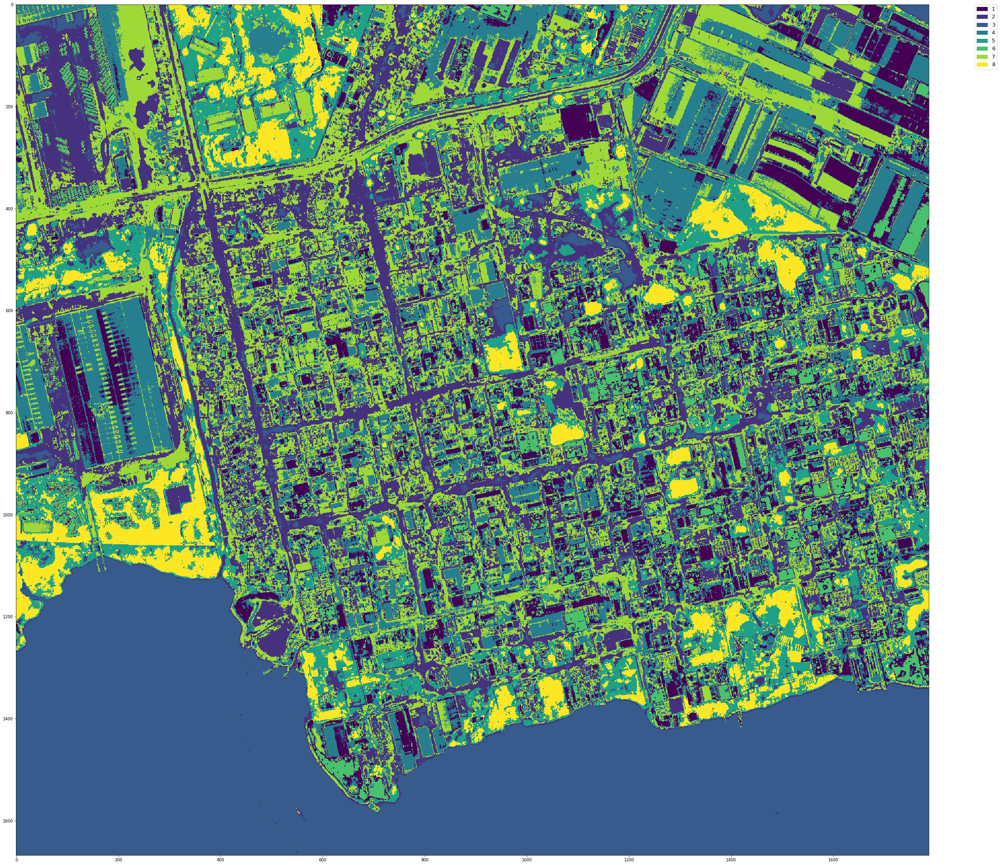

In [21]:
## Plot the result
fig, ax = plt.subplots(figsize = (40,40))
pred_data_text = predictedClass_text.reshape(all_bands_text_im.shape[:2])
im2 = ax.imshow(pred_data_text)
values = np.unique(pred_data_text)
cat_names = ["1","2","3","4","5","6","7","8"]
ep.draw_legend(im2,titles=cat_names)
plt.title("K-means - 8 bands plus texture")
# ax[1].imshow(bytescale(all_bands_stack))
plt.show()

In [22]:
# Fit the KMeans classifier to the 8-band raster stack
predictedClass_text_6_clusters = clf_kmeans_6_clusters.fit_predict(X_text, y=None)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass_text_6_clusters += 1


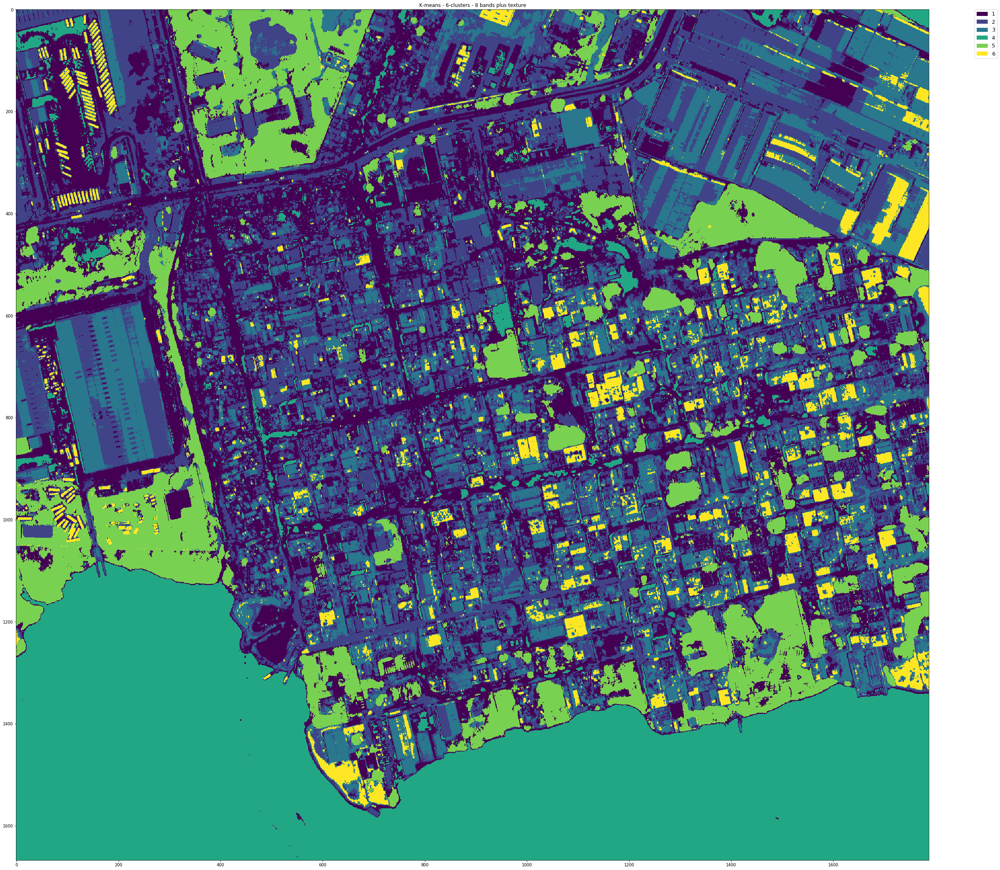

In [23]:
## Plot the result
fig, ax = plt.subplots(figsize = (40,40))
pred_data_text_6_clusters = predictedClass_text_6_clusters.reshape(all_bands_im.shape[:2])
im = ax.imshow(pred_data_text_6_clusters)
values = np.unique(pred_data_text_6_clusters)
cat_names = ["1","2","3","4","5","6"]
ep.draw_legend(im,titles=cat_names)
plt.title("K-means - 6-clusters - 8 bands plus texture")
# ax[1].imshow(all_bands_stack)
plt.show()

# Kmeans on index stack

In [ ]:
# # Reshape array 
# index_im = np.rollaxis(index_stack, 0, 3)
# X_index = index_im.reshape(-1,3)

# Why errors with index stack?

In [ ]:
# # Fit the KMeans classifier to the 8-band raster stack
# predictedClass_index = clf_kmeans.fit_predict(X_index, y=None)

# # use the fit model
# # predictedClass = clf_pl.predict(X_pl)
# predictedClass_index += 1

In [ ]:
# # Plot the result
# fig, ax = plt.subplots(figsize = (40,40))
# pred_data_index = predictedClass_index.reshape(index_im.shape[:2])
# im3 = ax.imshow(pred_data_index)
# values = np.unique(pred_data_index)
# cat_names = ["1","2","3","4","5","6","7","8"]
# ep.draw_legend(im3,titles=cat_names)
# plt.title("K-means - Index Stack")
# # ax[1].imshow(all_bands_stack)
# plt.show()

# Write out all k-means results as tif files

In [27]:
# Reshape predicted data (add axis) and write out files
pred_data_out = pred_data[np.newaxis,:]
pred_data_text_out = pred_data_text[np.newaxis,:]
pred_data_6_clusters_out = pred_data_6_clusters[np.newaxis,:]
pred_data_text_6_clusters_out = pred_data_text_6_clusters[np.newaxis,:]
# pred_data_index_out = pred_data_index[np.newaxis,:]

with rio.open(outputs_path+'kmeans_today_'+aoi+'.tif', 'w', **files_out_meta) as dst:
    dst.write(pred_data_out.astype('float32'))
with rio.open(outputs_path+'kmeans_text_'+aoi+'.tif', 'w', **files_out_meta) as dst:
    dst.write(pred_data_text_out.astype('float32'))
with rio.open(outputs_path+'kmeans_6_clusters_'+aoi+'.tif', 'w', **files_out_meta) as dst:
    dst.write(pred_data_6_clusters_out.astype('float32'))
with rio.open(outputs_path+'kmeans_text_6_clusters_'+aoi+'.tif', 'w', **files_out_meta) as dst:
    dst.write(pred_data_text_6_clusters_out.astype('float32'))
# with rio.open(outputs_path+'kmeans_index_'+aoi+'.tif', 'w', **index_stack_files_out_meta) as dst:
#     dst.write(pred_data_index_out.astype('float32'))

# Try GMM 

In [28]:
from sklearn.mixture import GaussianMixture

#Predict GMM cluster membership
clf_gm = GaussianMixture(n_components=8)#.fit(X_ps).predict(X_ps)

In [29]:
# Fit the GMM classifier to the 8-band stack
predictedClass_gm = clf_gm.fit_predict(X, y=None)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass_gm += 1

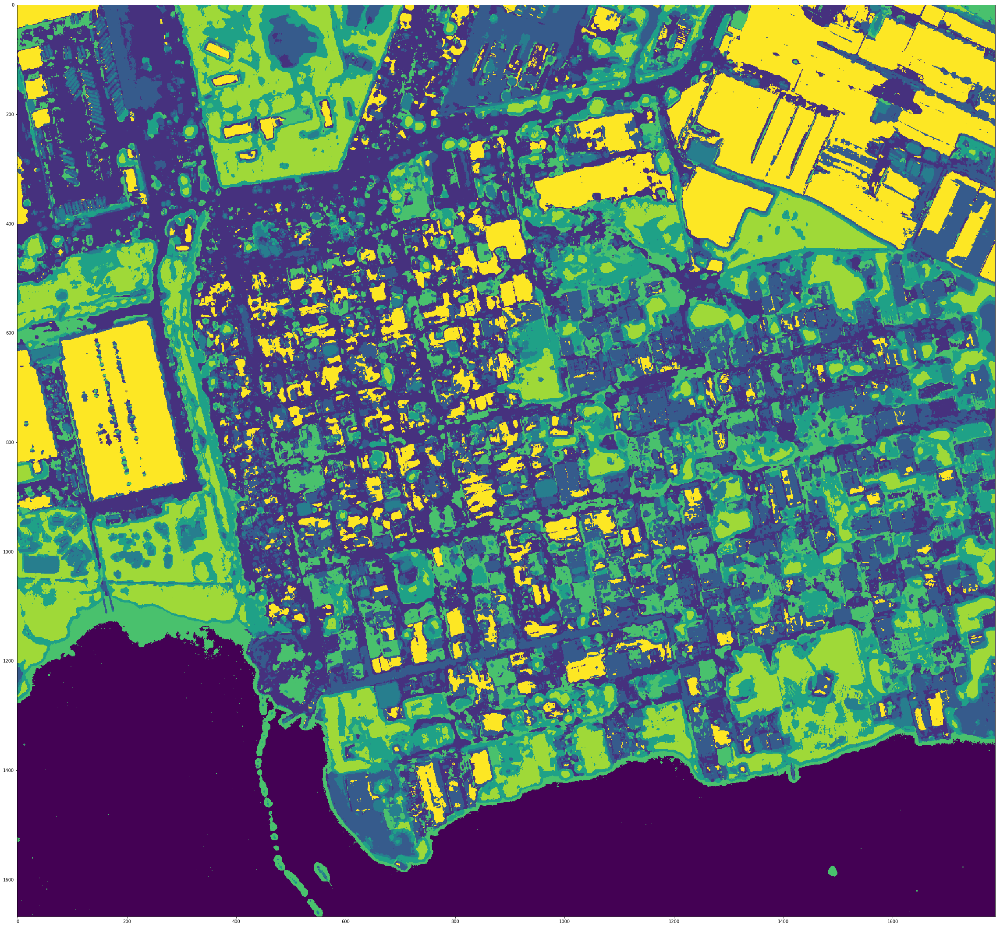

In [30]:
## Plot the result
fig, ax = plt.subplots(figsize = (40,40))
pred_data_gm = predictedClass_gm.reshape(all_bands_im.shape[:2])
ax.imshow(pred_data_gm)
# ax[1].imshow(bytescale(all_bands_stack))
plt.show()

In [31]:
# fit the GMM classifier to the 8 band stack plus texture
predictedClass_gm_text = clf_gm.fit_predict(X_text, y=None)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass_gm_text += 1

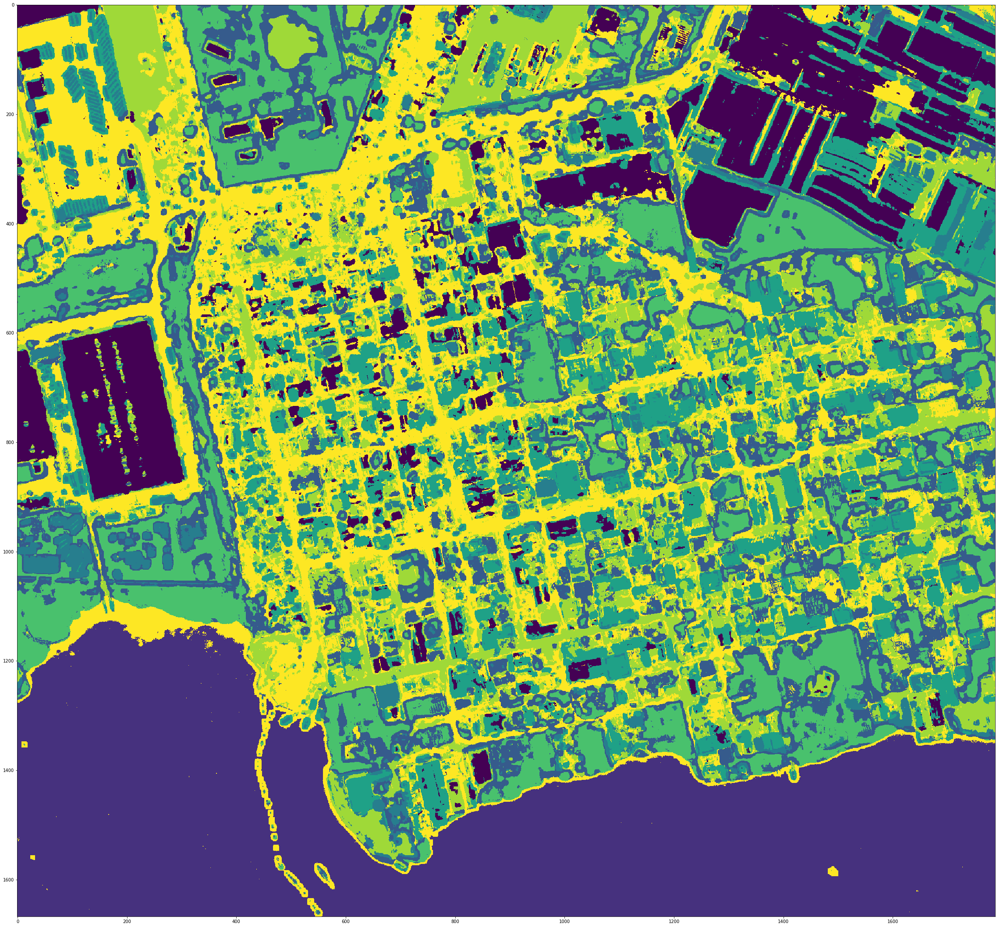

In [32]:
## Plot the result
fig, ax = plt.subplots(figsize = (40,40))
pred_data_gm_text = predictedClass_gm_text.reshape(all_bands_text_im.shape[:2])
ax.imshow(pred_data_gm_text)
# ax[1].imshow(bytescale(all_bands_stack))
plt.show()

In [ ]:
# fit the GMM classifier to the index stack
# predictedClass_gm_index = clf_gm.fit_predict(X_index, y=None)

# # use the fit model
# # predictedClass = clf_pl.predict(X_index)
# predictedClass_gm_index += 1

In [ ]:
## Plot the result
# fig, ax = plt.subplots(figsize = (40,40))
# pred_data_gm_index = predictedClass_gm_index.reshape(index_im.shape[:2])
# ax.imshow(pred_data_gm_index)
# # ax[1].imshow(bytescale(all_bands_stack))
# plt.show()

In [33]:
# Reshape predicted data (add axis) and write out files
pred_data_gm_ps_out = pred_data_gm[np.newaxis,:]
pred_data_gm_text_out = pred_data_gm_text[np.newaxis,:]
# pred_data_gm_index_out = pred_data_gm_index[np.newaxis,:]

with rio.open(outputs_path+'GMM_'+aoi+'.tif', 'w', **files_out_meta) as dst:
    dst.write(pred_data_gm_ps_out.astype('float32'))
with rio.open(outputs_path+'GMM_text_'+aoi+'.tif', 'w', **files_out_meta) as dst:
    dst.write(pred_data_gm_text_out.astype('float32'))
# with rio.open(outputs_path+'GMM_index_'+aoi+'.tif', 'w', **files_out_meta) as dst:
#     dst.write(pred_data_gm_index_out.astype('float32'))

## Try clustering on RGB-NIR image

In [34]:
# Reshape RGB-NIR image
im_rgb_arr = np.rollaxis(rgb_bands, 0, 3)
X_rgb = im_rgb_arr.reshape(-1,4)

# Fit the KMeans classifier to RBG-NIR image
predictedClass_rgb = clf_kmeans.fit_predict(X_rgb, y=None)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass_rgb += 1

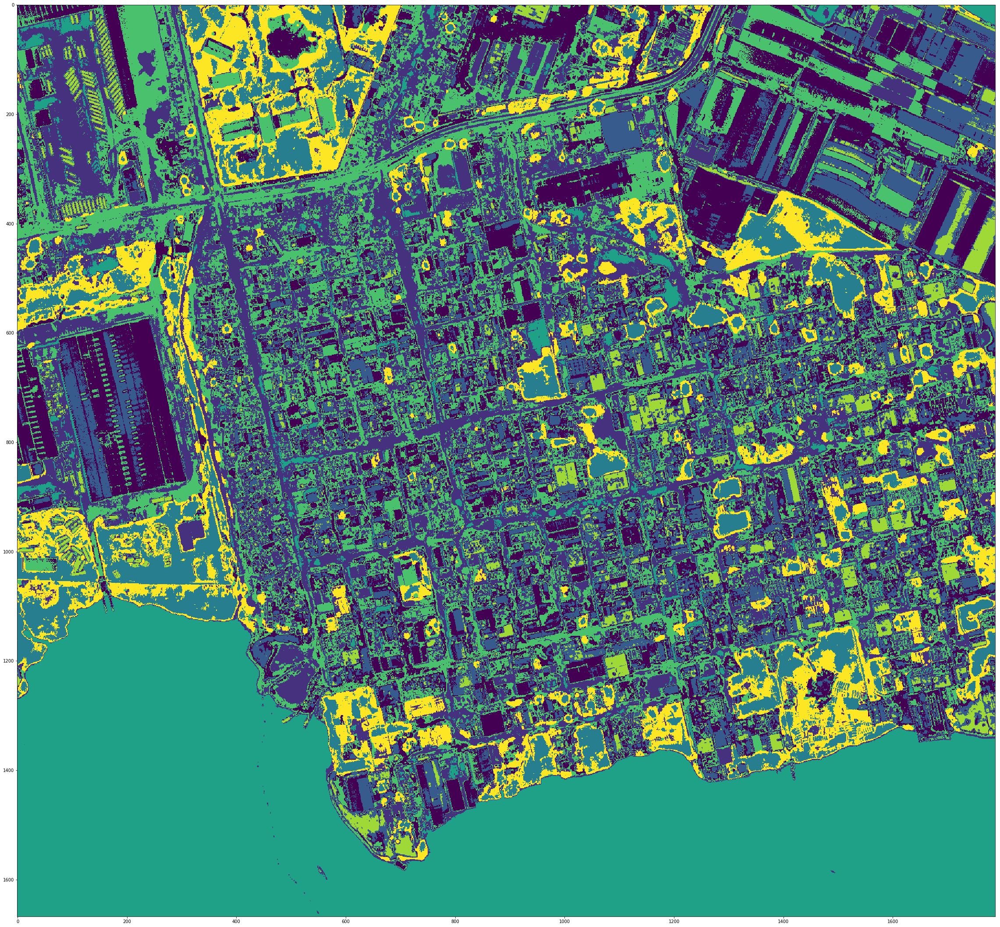

In [35]:
## show the result
fig, ax = plt.subplots(figsize = (40,40))
pred_data_rgb = predictedClass_rgb.reshape(im_rgb_arr.shape[:2])
ax.imshow(pred_data_rgb)
# ax[1].imshow(bytescale(all_bands_stack))
plt.show()

In [36]:
# fit the GMM classifier to the rgb band stack 
predictedClass_gm_rgb = clf_gm.fit_predict(X_rgb, y=None)

# use the fit model
# predictedClass = clf_pl.predict(X_pl)
predictedClass_gm_rgb += 1

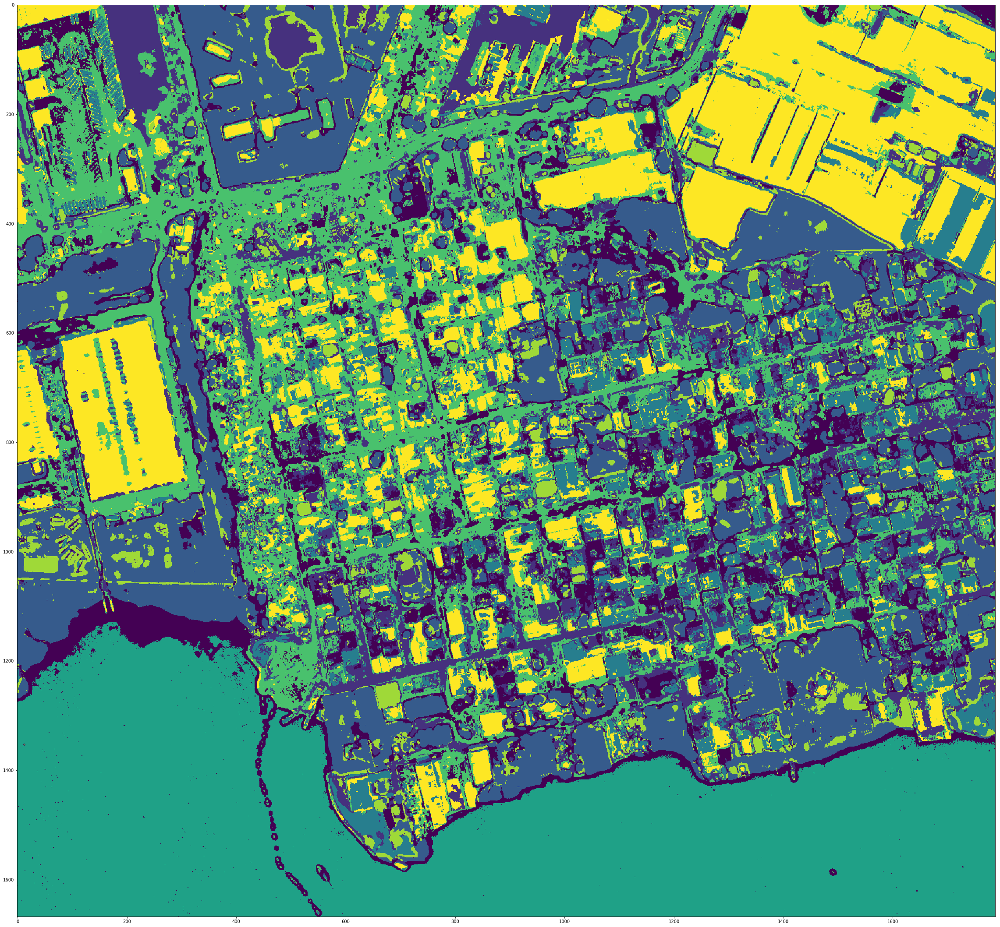

In [38]:
## show the result
fig, ax = plt.subplots(figsize = (40,40))
pred_data_gm_rgb = predictedClass_gm_rgb.reshape(im_rgb_arr.shape[:2])
ax.imshow(pred_data_gm_rgb)
# ax[1].imshow(bytescale(all_bands_stack))
plt.show()

In [39]:
# Write out RGB kmeans results
pred_data_rgb_out = pred_data_rgb[np.newaxis,:]
pred_data_gm_rgb_out = pred_data_gm_rgb[np.newaxis,:]

with rio.open(outputs_path+'kmeans_rgb_'+aoi+'.tif', 'w', **files_out_meta) as dst:
    dst.write(pred_data_rgb_out.astype('float32'))
with rio.open(outputs_path+'GMM_rgb_'+aoi+'.tif', 'w', **files_out_meta) as dst:
    dst.write(pred_data_gm_rgb_out.astype('float32'))

# Explore segmentation 

In [40]:
# Import segmentation packages from scikit-image
from skimage.color import rgb2gray
from skimage.filters import sobel
from skimage.segmentation import felzenszwalb, slic, quickshift, watershed
from skimage.segmentation import mark_boundaries
from skimage.util import img_as_float


im_rgb = np.rollaxis(rgb_bands, 0, 3)
# im_index = np.rollaxis(index_stack,0,3)
# img = im_arr_ps 
img = im_rgb
img[:,:,0] /= img[:,:,0].max()
img[:,:,1] /= img[:,:,1].max()
img[:,:,2] /= img[:,:,2].max()
img[:,:,3] /= img[:,:,3].max()
# img[:,:,4] /= img[:,:,4].max()
# img[:,:,5] /= img[:,:,5].max()
# img[:,:,6] /= img[:,:,6].max()
# img[:,:,7] /= img[:,:,7].max()

# Added "astype(float)" to make SLIC work

In [41]:
# Define segmenters
# segments_fz = felzenszwalb(img, scale=10, sigma=0.5, min_size=50)
# segments_slic = slic(img, n_segments=500, compactness=.1, sigma=1)
# segments_quick = quickshift(img[:,:,:3], kernel_size=7, max_dist=6, ratio=0.5)
# gradient = sobel(rgb2gray(img[:,:,:3]))
# segments_watershed = watershed(gradient, markers=500, compactness=.001)


segments_fz = felzenszwalb(img[:,:,:3], scale=100, sigma=0.5, min_size=50)
segments_slic = slic(img.astype(float), n_segments=250, compactness=100, sigma=1)
segments_quick = quickshift(img[:,:,:3], kernel_size=3, max_dist=10, ratio=0.5)
gradient = sobel(rgb2gray(img[:,:,:3]))
segments_watershed = watershed(gradient, markers=250, compactness=0.01)


C:\Users\katy\Anaconda3\envs\earth-analytics-python\lib\site-packages\skimage\filters\edges.py:104: RuntimeWarning: invalid value encountered in sqrt
  out = np.sqrt(sobel_h(image, mask)**2 + sobel_v(image, mask)**2)


In [42]:
# Print outputs
print("Felzenszwalb number of segments: {}".format(len(np.unique(segments_fz))))
print('SLIC number of segments: {}'.format(len(np.unique(segments_slic))))
print('Quickshift number of segments: {}'.format(len(np.unique(segments_quick))))

Felzenszwalb number of segments: 4046
SLIC number of segments: 240
Quickshift number of segments: 5280


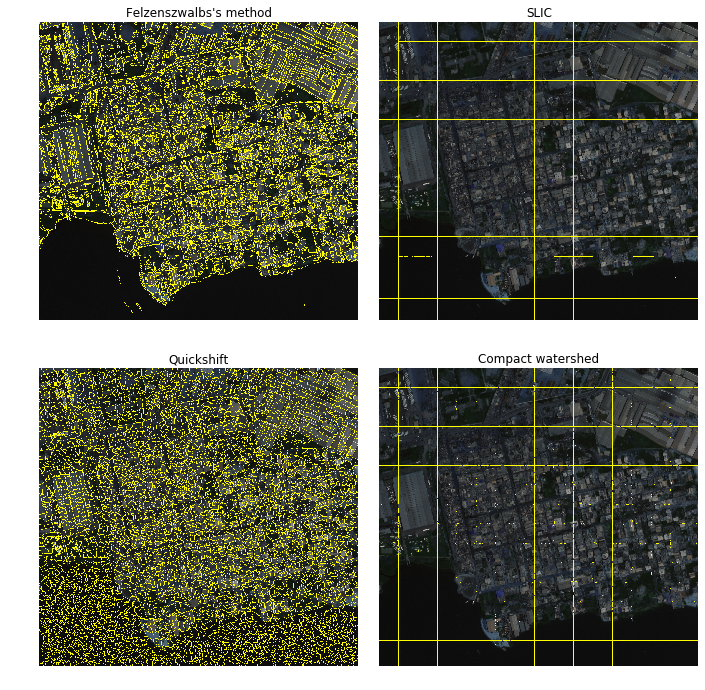

In [43]:
# Plot segmentation results

fig, ax = plt.subplots(2, 2, figsize=(10, 10), sharex=True, sharey=True)

ax[0, 0].imshow(mark_boundaries(img[:,:,:3], segments_fz))
ax[0, 0].set_title("Felzenszwalbs's method")
ax[0, 1].imshow(mark_boundaries(img[:,:,:3], segments_slic))
ax[0, 1].set_title('SLIC')
ax[1, 0].imshow(mark_boundaries(img[:,:,:3], segments_quick))
ax[1, 0].set_title('Quickshift')
ax[1, 1].imshow(mark_boundaries(img[:,:,:3], segments_watershed))
ax[1, 1].set_title('Compact watershed')

for a in ax.ravel():
    a.set_axis_off()

plt.tight_layout()
plt.show()

In [44]:
## For one of the segmented images, get some histogram measures for each band
def calc_meas(arr, m_type):
    
    try:
        if m_type == 'mean':
            res = np.mean(arr)

        elif m_type == 'std':
            res = np.std(arr)

        elif m_type == 'range':
            res = np.max(arr) - np.min(arr)

        elif m_type == 'entropy':
            pdf = np.histogram(arr, norm=True)
            pdf = pdf[pdf>0]
            ent = -np.sum(pdf*np.log2(pdf))
            res = ent
            
        else:
            res = 0
    except Exception as e:
        #print(e)
        res = 0
    
    return res


def regionHistMeasures(labeled_im, intensity_im, attrs=['mean']):
    
    num_bands = intensity_im.shape[-1]
    labels = np.unique(labeled_im)
    
    meas_arr = np.zeros((labels.size, len(attrs)*num_bands))
    meas_ls = []
    idx=0
    for meas_type in attrs:
        
        # iterate over the bands
        band_meas = []
        for b in range(num_bands):

            # get the band
            temp_arr = intensity_im[:,:,b]

            # iterate over labels
            seg_meas = []
            for j,lb in enumerate(labels):

                # get the labeled pixels
                temp_arr1 = temp_arr[labeled_im == lb]

                # calculate something
                meas = calc_meas(temp_arr1, meas_type)

                # append to seg list
                seg_meas.append(meas)
                
                
            # seg_meas is a list of the value for the [measurement for each label for the current band]
            # this is inserted into the result array by slicing the correct column
            meas_arr[:, idx] = seg_meas
            idx +=1
            
            # append to band list
            #band_meas.append(seg_meas)
            
            
        # append to attr list
        #meas_ls.append(band_meas)
        
    return meas_arr

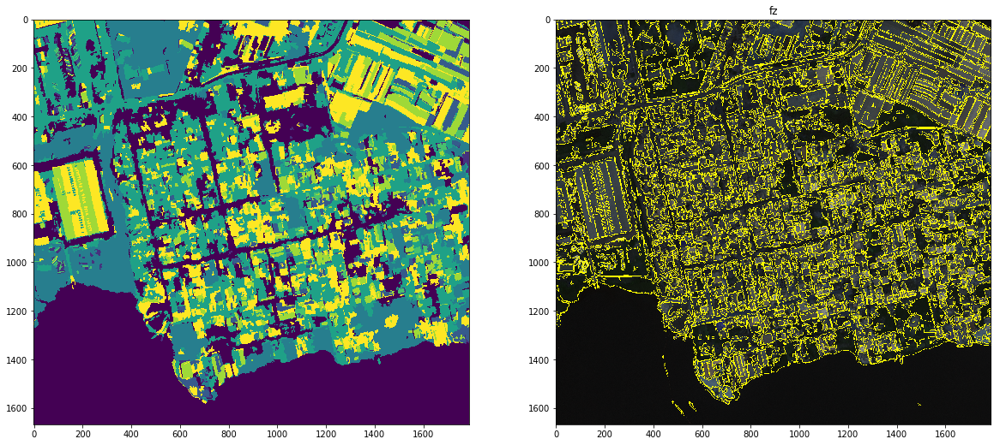

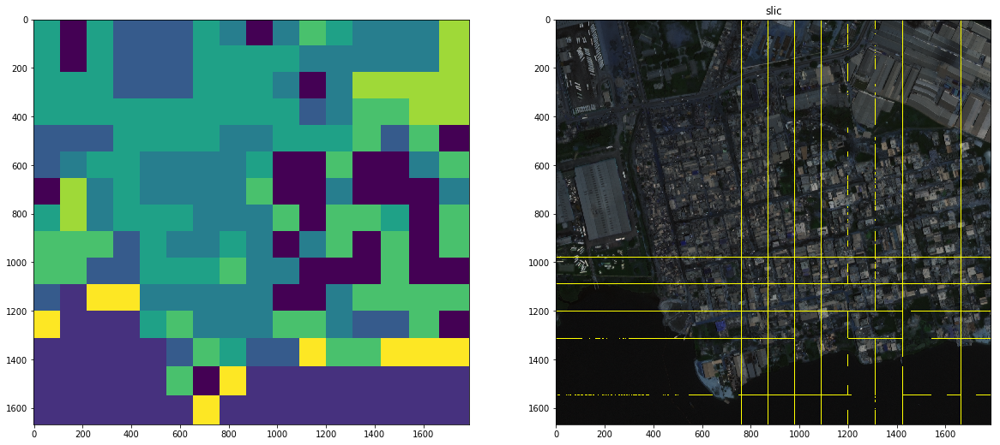

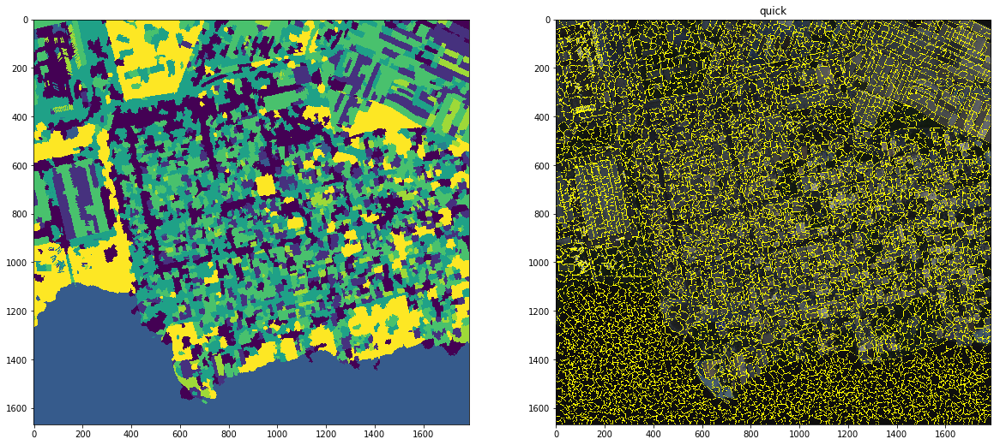

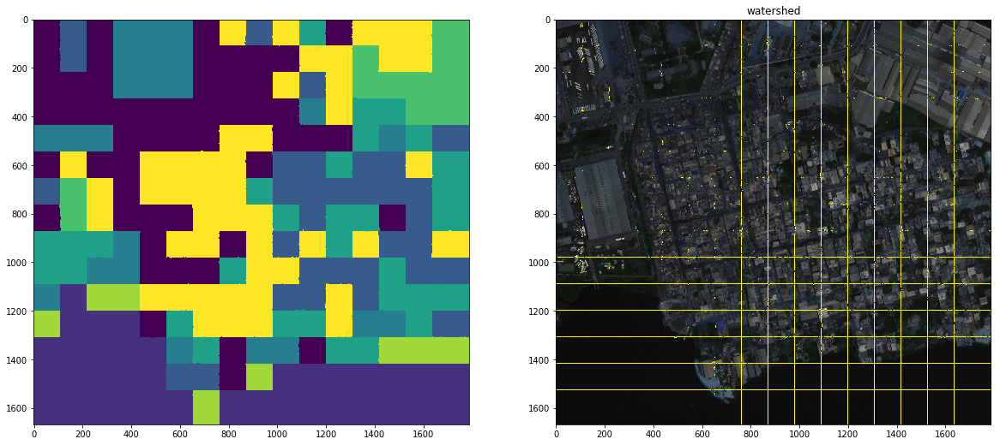

In [45]:
# test the segmentation classification

for seg_im, title in zip([segments_fz, segments_slic, segments_quick, segments_watershed], ['fz', 'slic', 'quick', 'watershed']):
# for seg_im, title in zip([segments_fz, segments_quick, segments_watershed], ['fz', 'quick', 'watershed']):
    
    
    seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std', 'range', 'entropy'])
    seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std'])
#     seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std', 'entropy'])
    #seg_attrs = regionHistMeasures(seg_im, img, attrs=['mean', 'std', 'range'])
    
    ## now run the classifier on the image segments
    clf_seg = KMeans(n_clusters=nclass, random_state=10)

    # fit it on the segment table
    # fit the KMeans classifier
    predictedClass_seg = clf_seg.fit_predict(seg_attrs, y=None)

    # use the fit model
    # predictedClass = clf_pl.predict(X_pl)
    predictedClass_seg += 1

    ## reassign the segment image to these class labels
    labels = np.unique(seg_im)
    kmeans_seg_im = np.zeros(seg_im.shape)
    for i,lb in enumerate(labels):
        kmeans_seg_im[seg_im==lb] = predictedClass_seg[i]

    
    fig, ax = plt.subplots(1,2, figsize = (20,10))
    ax[0].imshow(kmeans_seg_im)
    ax[1].imshow(mark_boundaries(img[:,:,:3], seg_im))
    ax[1].set_title(title)
    
    plt.show()

Doesn't appear that segmentation adds much more than just using Kmeans cluster results. For now.. go forward with Kmeans. 

In [ ]:
# from sklearn.decomposition import PCA
# pca = PCA(n_components=2)
# pca.fit(X_ps)
# print(pca.explained_variance_)
# print(pca.components_)

In [ ]:
# plt.plot(X_ps[:, 0], X_ps[:, 1], 'o', alpha=0.5)
# for length, vector in zip(pca.explained_variance_, pca.components_):
#     v = vector * 3 * np.sqrt(length)
#     plt.plot([0, v[0]], [0, v[1]], '-k', lw=3)
# plt.axis('equal');

# Label kmeans cluster result using skimage measure.label

This part of the analysis will explore using a labeled image to identify characteristics of flood vs. shadow objects. 

In [46]:
from skimage import measure
from skimage import morphology

# patch_labels = measure.label(all_bands_stack) 

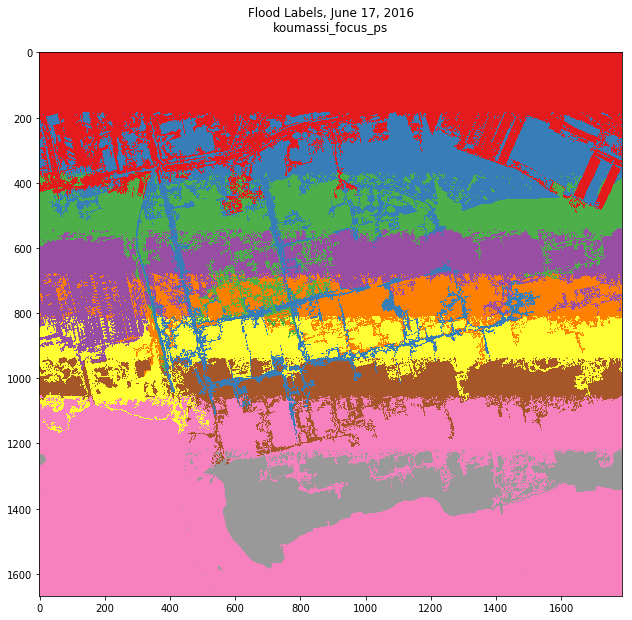

In [47]:
patch_labels = measure.label(pred_data) 
props = measure.regionprops(patch_labels, intensity_image = pred_data) 

# patchsize_thresh = 30
# small_patches = []
# for prop in props:
#     if prop.area < 2:
#         small_patches.append(prop.label)
# len(small_patches)

# Plot flood label layer 
fig, ax = plt.subplots(figsize=(20,10))
flood_cleaned_plot = ax.imshow(patch_labels, cmap='Set1')
ax.set(title="Flood Labels, June 17, 2016\n"+aoi+"\n")
# ax.set_axis_off()
plt.show()

In [48]:
props_df=pd.DataFrame(props)
props_df.head()
props[0].area

90

In [49]:
len(props)

56257

In [50]:
help(measure.regionprops)

Help on function regionprops in module skimage.measure._regionprops:

regionprops(label_image, intensity_image=None, cache=True, coordinates=None)
    Measure properties of labeled image regions.
    
    Parameters
    ----------
    label_image : (N, M) ndarray
        Labeled input image. Labels with value 0 are ignored.
    
        .. versionchanged:: 0.14.2
            Previously, ``label_image`` was processed by ``numpy.squeeze`` and
            so any number of singleton dimensions was allowed. This resulted in
            inconsistent handling of images with singleton dimensions. To
            recover the old behaviour, use
            ``regionprops(np.squeeze(label_image), ...)``.
    intensity_image : (N, M) ndarray, optional
        Intensity (i.e., input) image with same size as labeled image.
        Default is None.
    cache : bool, optional
        Determine whether to cache calculated properties. The computation is
        much faster for cached properties, whereas t

In [51]:
label_1 = []
for prop in props[:10]:
#     if prop.label == 1:
#         label_1.append(prop.label)
    print(prop.label)
# len(label_1)

1
2
3
4
5
6
7
8
9
10


In [52]:
# Make list of all non-dunder attributes of regionprops object
def scalar_attributes_list(im_props):
    """
    Makes list of all scalar, non-dunder, non-hidden
    attributes of skimage.measure.regionprops object
    """
    
    attributes_list = []
    
    for i, test_attribute in enumerate(dir(im_props[0])):
        
        #Attribute should not start with _ and cannot return an array
        #does not yet return tuples
        if test_attribute[:1] != '_' and not\
                isinstance(getattr(im_props[0], test_attribute), np.ndarray):                
            attributes_list += [test_attribute]
            
    return attributes_list

In [53]:
def regionprops_to_df(im_props):
    """
    Read content of all attributes for every item in a list
    output by skimage.measure.regionprops
    """

    attributes_list = scalar_attributes_list(im_props)

    # Initialise list of lists for parsed data
    parsed_data = []

    # Put data from im_props into list of lists
    for i, _ in enumerate(im_props):
        parsed_data += [[]]
        
        for j in range(len(attributes_list)):
            parsed_data[i] += [getattr(im_props[i], attributes_list[j])]

    # Return as a Pandas DataFrame
    return pd.DataFrame(parsed_data, columns=attributes_list)

In [54]:
regionprops_to_df(props)

C:\Users\katy\Anaconda3\envs\earth-analytics-python\lib\site-packages\skimage\measure\_regionprops.py:250: UserWarning: regionprops and image moments (including moments, normalized moments, central moments, and inertia tensor) of 2D images will change from xy coordinates to rc coordinates in version 0.16.
See http://scikit-image.org/docs/0.14.x/release_notes_and_installation.html#deprecations for details on how to avoid this message.
  warn(XY_TO_RC_DEPRECATION_MESSAGE)
C:\Users\katy\Anaconda3\envs\earth-analytics-python\lib\site-packages\skimage\measure\_regionprops.py:260: UserWarning: regionprops and image moments (including moments, normalized moments, central moments, and inertia tensor) of 2D images will change from xy coordinates to rc coordinates in version 0.16.
See http://scikit-image.org/docs/0.14.x/release_notes_and_installation.html#deprecations for details on how to avoid this message.
  warn(XY_TO_RC_DEPRECATION_MESSAGE)


,area,bbox,bbox_area,centroid,convex_area,eccentricity,equivalent_diameter,euler_number,extent,filled_area,...,local_centroid,major_axis_length,max_intensity,mean_intensity,min_intensity,minor_axis_length,orientation,perimeter,solidity,weighted_centroid
0,90,"(0, 0, 28, 7)",196,"(14.88888888888889, 1.9444444444444444)",119,0.981781,10.704745,0,0.459184,91,...,"(14.88888888888889, 1.9444444444444444)",28.062385,4,4.0,4,5.332297,-1.415013,59.313708,0.756303,"(14.88888888888889, 1.9444444444444444)"
1,2,"(0, 1, 2, 2)",2,"(0.5, 1.0)",2,1.000000,1.595769,1,1.000000,2,...,"(0.5, 0.0)",2.000000,1,1.0,1,0.000000,-1.570796,0.000000,1.000000,"(0.5, 1.0)"
2,3,"(0, 2, 3, 3)",3,"(1.0, 2.0)",3,1.000000,1.954410,1,1.000000,3,...,"(1.0, 0.0)",3.265986,7,7.0,7,0.000000,-1.570796,1.000000,1.000000,"(1.0, 2.0)"
3,2474,"(0, 3, 37, 149)",5402,"(11.325788197251415, 65.67380759902991)",3263,0.979112,56.124813,-15,0.457979,2593,...,"(11.325788197251415, 62.673807599029914)",148.958823,4,4.0,4,30.286867,0.074776,840.635606,0.758198,"(11.325788197251415, 65.67380759902991)"
4,1,"(0, 12, 1, 13)",1,"(0.0, 12.0)",1,0.000000,1.128379,1,1.000000,1,...,"(0.0, 0.0)",0.000000,7,7.0,7,0.000000,0.785398,0.000000,1.000000,"(0.0, 12.0)"
5,5,"(0, 12, 4, 14)",8,"(1.4, 12.4)",5,0.955796,2.523133,1,0.625000,5,...,"(1.4, 0.4)",4.341695,1,1.0,1,1.276589,1.204389,4.207107,1.000000,"(1.4, 12.4)"
6,11,"(0, 21, 7, 24)",21,"(2.8181818181818183, 21.90909090909091)",17,0.962691,3.742410,1,0.523810,11,...,"(2.8181818181818183, 0.9090909090909091)",8.754208,1,1.0,1,2.368918,-1.318151,11.621320,0.647059,"(2.8181818181818183, 21.90909090909091)"
7,2,"(0, 31, 2, 32)",2,"(0.5, 31.0)",2,1.000000,1.595769,1,1.000000,2,...,"(0.5, 0.0)",2.000000,1,1.0,1,0.000000,-1.570796,0.000000,1.000000,"(0.5, 31.0)"
8,3,"(0, 32, 3, 33)",3,"(1.0, 32.0)",3,1.000000,1.954410,1,1.000000,3,...,"(1.0, 0.0)",3.265986,7,7.0,7,0.000000,-1.570796,1.000000,1.000000,"(1.0, 32.0)"
9,4,"(0, 40, 3, 42)",6,"(0.75, 40.75)",4,0.912871,2.256758,1,0.666667,4,...,"(0.75, 0.75)",3.464102,1,1.0,1,1.414214,-1.249046,3.207107,1.000000,"(0.75, 40.75)"


In [55]:
props[1].coords

array([[0, 1],
       [1, 1]], dtype=int64)

Next step is to update kmeans so that all shadow and all water are in separate clusters using information from regionprops. 